In [1]:
import pandas as pd
import sklearn 
from sklearn import preprocessing
import sqlite3 
import json
import numpy as np
import matplotlib.pyplot as plt
import statsmodels.api as sm
from statsmodels.formula.api import ols
import seaborn as sns
import folium 
import folium.plugins as plugins
import branca.colormap as cm
%matplotlib inline

In [2]:
df = pd.read_csv('data/kc_house_data.csv')

In [3]:
def clean_df(df_copy, 
            bedrooms_min=3, 
            bedrooms_max=4, 
            condition_min = 1, 
            condition_max = 4, 
            grade_min = 5, 
            grade_max = 11, 
            house_age_min = 0, 
            house_age_max = 300, 
            price_min = 0, 
            price_max = 7700000):
    df_copy = df.copy()
    drop_columns = ['waterfront', 'view', 'sqft_above', 'sqft_basement','sqft_lot','sqft_living15','sqft_lot15']
    condition_dict = {'Poor':0, 'Fair':1, 'Average':2, 'Good':3, 'Very Good':4}
    df_copy.drop(drop_columns, axis= 1, inplace=True)
    df_copy = df_copy[df_copy['bedrooms']!=33]
    
    df_copy['date'] = pd.to_datetime(df_copy["date"])
    
    df_copy['grade_value'] = df_copy['grade'].map(lambda x: x[:2])
    df_copy['grade_value'] = df_copy['grade_value'].astype(int)
    df_copy['age'] = df_copy['yr_built']
    df_copy.loc[df_copy['yr_renovated'] != 0, 'age'] = df_copy['yr_renovated']
    df_copy['age'] = df_copy['age'].map(lambda x: 2015-x)
    df_copy['condition_num'] = df_copy['condition'].map(condition_dict)
    df_copy = df_copy[df_copy['bedrooms'] >= bedrooms_min]
    df_copy = df_copy[df_copy['bedrooms'] <= bedrooms_max]
    df_copy = df_copy[df_copy['condition_num'] >= condition_min]
    df_copy = df_copy[df_copy['condition_num'] <= condition_max]
    df_copy = df_copy[df_copy['grade_value'] >= grade_min]
    df_copy = df_copy[df_copy['grade_value'] <= grade_max]
    df_copy = df_copy[df_copy['age'] >= house_age_min]
    df_copy = df_copy[df_copy['age'] <= house_age_max]
    df_copy = df_copy[df_copy['price'] >= price_min]
    df_copy = df_copy[df_copy['price'] <= price_max]
    df_clean = df_copy.copy()
    return(df_clean)

In [4]:
df = clean_df(df)
df

,id,date,price,bedrooms,bathrooms,sqft_living,floors,condition,grade,yr_built,yr_renovated,zipcode,lat,long,grade_value,age,condition_num
0,7129300520,2014-10-13,221900.0,3,1.00,1180,1.0,Average,7 Average,1955,0.0,98178,47.5112,-122.257,7,60.0,2
1,6414100192,2014-12-09,538000.0,3,2.25,2570,2.0,Average,7 Average,1951,1991.0,98125,47.7210,-122.319,7,24.0,2
3,2487200875,2014-12-09,604000.0,4,3.00,1960,1.0,Very Good,7 Average,1965,0.0,98136,47.5208,-122.393,7,50.0,4
4,1954400510,2015-02-18,510000.0,3,2.00,1680,1.0,Average,8 Good,1987,0.0,98074,47.6168,-122.045,8,28.0,2
5,7237550310,2014-05-12,1230000.0,4,4.50,5420,1.0,Average,11 Excellent,2001,0.0,98053,47.6561,-122.005,11,14.0,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
21590,7936000429,2015-03-26,1010000.0,4,3.50,3510,2.0,Average,9 Better,2009,0.0,98136,47.5537,-122.398,9,6.0,2
21591,2997800021,2015-02-19,475000.0,3,2.50,1310,2.0,Average,8 Good,2008,0.0,98116,47.5773,-122.409,8,7.0,2
21592,263000018,2014-05-21,360000.0,3,2.50,1530,3.0,Average,8 Good,2009,0.0,98103,47.6993,-122.346,8,6.0,2
21593,6600060120,2015-02-23,400000.0,4,2.50,2310,2.0,Average,8 Good,2014,0.0,98146,47.5107,-122.362,8,1.0,2


In [5]:
df.duplicated(subset='id').sum()

81

In [6]:
df['condition'].value_counts()

Average      8922
Good         3587
Very Good    1081
Fair           89
Name: condition, dtype: int64

In [7]:
df = df[df['grade'] != '4 Low']

In [8]:
df['age'] = df['yr_built']
df.loc[df['yr_renovated'] != 0, 'age'] = df['yr_renovated']
df['age'] = df['age'].map(lambda x: 2015-x)

In [9]:
df

,id,date,price,bedrooms,bathrooms,sqft_living,floors,condition,grade,yr_built,yr_renovated,zipcode,lat,long,grade_value,age,condition_num
0,7129300520,2014-10-13,221900.0,3,1.00,1180,1.0,Average,7 Average,1955,0.0,98178,47.5112,-122.257,7,60.0,2
1,6414100192,2014-12-09,538000.0,3,2.25,2570,2.0,Average,7 Average,1951,1991.0,98125,47.7210,-122.319,7,24.0,2
3,2487200875,2014-12-09,604000.0,4,3.00,1960,1.0,Very Good,7 Average,1965,0.0,98136,47.5208,-122.393,7,50.0,4
4,1954400510,2015-02-18,510000.0,3,2.00,1680,1.0,Average,8 Good,1987,0.0,98074,47.6168,-122.045,8,28.0,2
5,7237550310,2014-05-12,1230000.0,4,4.50,5420,1.0,Average,11 Excellent,2001,0.0,98053,47.6561,-122.005,11,14.0,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
21590,7936000429,2015-03-26,1010000.0,4,3.50,3510,2.0,Average,9 Better,2009,0.0,98136,47.5537,-122.398,9,6.0,2
21591,2997800021,2015-02-19,475000.0,3,2.50,1310,2.0,Average,8 Good,2008,0.0,98116,47.5773,-122.409,8,7.0,2
21592,263000018,2014-05-21,360000.0,3,2.50,1530,3.0,Average,8 Good,2009,0.0,98103,47.6993,-122.346,8,6.0,2
21593,6600060120,2015-02-23,400000.0,4,2.50,2310,2.0,Average,8 Good,2014,0.0,98146,47.5107,-122.362,8,1.0,2


In [10]:
df['grade'].value_counts()

7 Average        5818
8 Good           4105
9 Better         1808
6 Low Average     886
10 Very Good      753
11 Excellent      240
5 Fair             69
Name: grade, dtype: int64

In [11]:
df['grade'].replace(('5 Fair', '6 Low Average', '7 Average', '8 Good', '9 Better', '10 Very Good', '11 Excellent'), (5, 6, 7, 8, 9, 10, 11), inplace=True)

<AxesSubplot:>

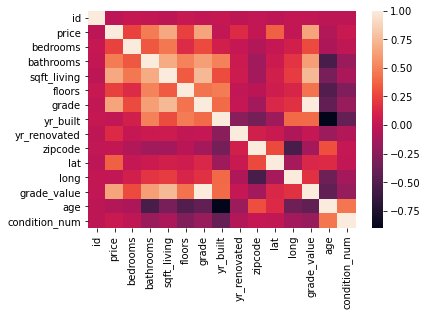

In [12]:
sns.heatmap(df.corr())

C:\Users\grego\anaconda3\envs\learn-env\lib\site-packages\seaborn\distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


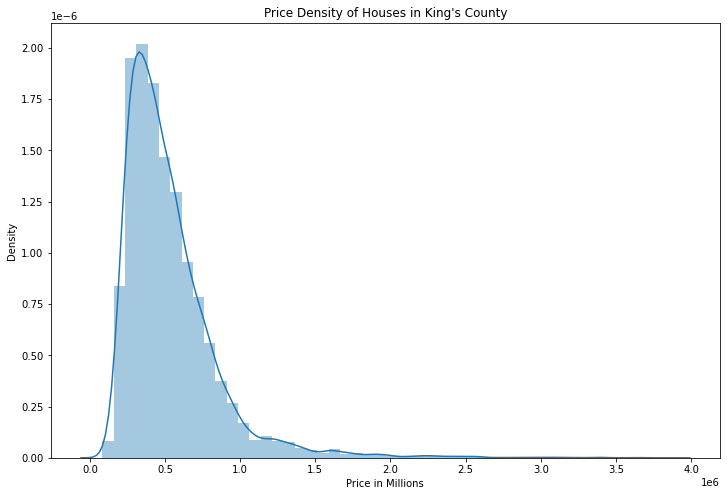

In [13]:
plt.figure(figsize=(12,8))

price_dist = sns.distplot(df["price"])
price_dist.set(xlabel="Price in Millions", title="Price Density of Houses in King's County")
plt.show()

In [14]:
logged_price = np.log(df["price"])

C:\Users\grego\anaconda3\envs\learn-env\lib\site-packages\seaborn\distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


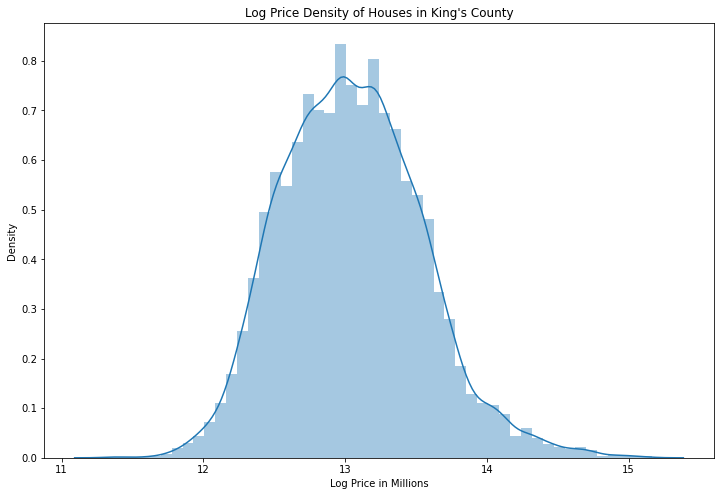

In [15]:
plt.figure(figsize=(12,8))

logged_price_dist = sns.distplot(np.log(df["price"]))
logged_price_dist.set(xlabel="Log Price in Millions", title="Log Price Density of Houses in King's County")
plt.show()

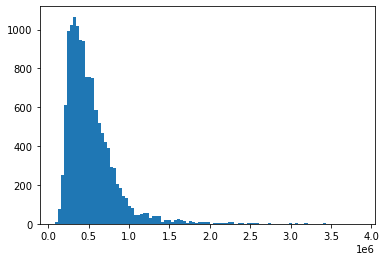

In [16]:
plt.hist(df['price'], bins=100);

C:\Users\grego\anaconda3\envs\learn-env\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


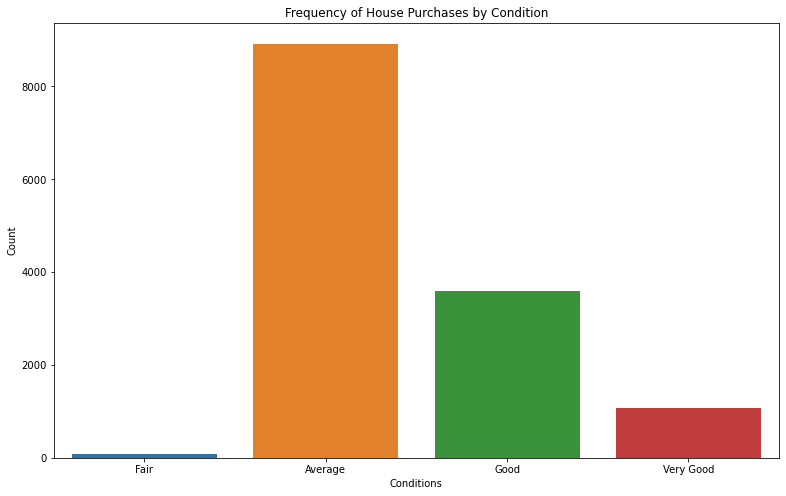

In [17]:
plt.figure(figsize=(13,8))

cond_group = df.groupby(by=["condition_num"])
cond_freq = cond_group.size()
cond_freq_plot = sns.barplot(cond_freq.index, cond_freq.values)
cond_freq_plot.set(xlabel="Conditions", ylabel="Count", title="Frequency of House Purchases by Condition")
cond_freq_plot.set_xticklabels(['Fair', 'Average', 'Good', 'Very Good'])
plt.show();

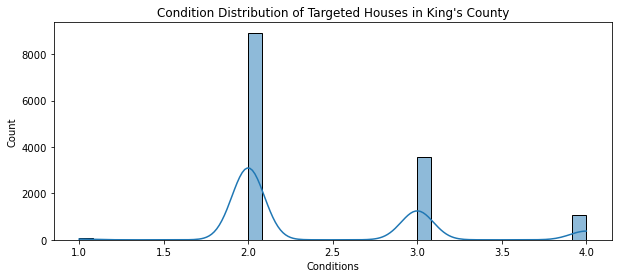

In [18]:
plt.figure(figsize=(10,4))

cond_dist = sns.histplot(df["condition_num"], kde=True)
cond_dist.set(xlabel="Conditions", title="Condition Distribution of Targeted Houses in King's County")

plt.show()

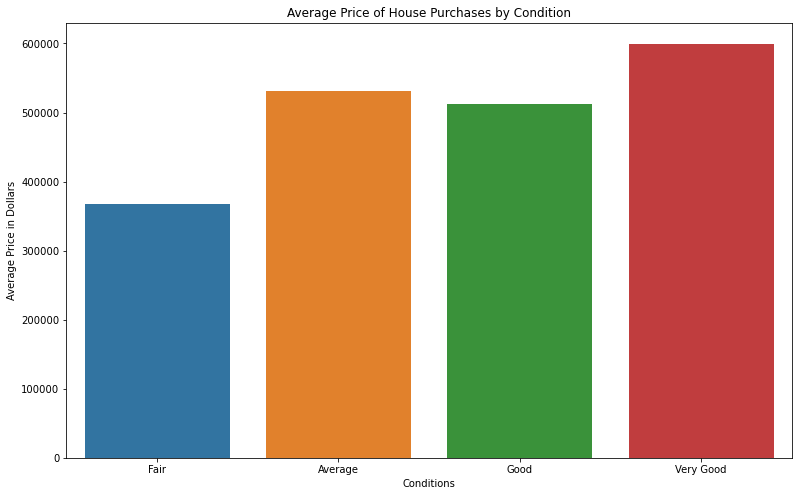

In [19]:
plt.figure(figsize=(13,8))

cond_price = cond_group["price"].mean()
cond_avg_price_plot = sns.barplot(x=cond_price.index, y=cond_price.values)
cond_avg_price_plot.set(xlabel="Conditions", ylabel="Average Price in Dollars", title="Average Price of House Purchases by Condition")
cond_avg_price_plot.set_xticklabels(['Fair', 'Average', 'Good', 'Very Good'])
plt.show()

C:\Users\grego\anaconda3\envs\learn-env\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


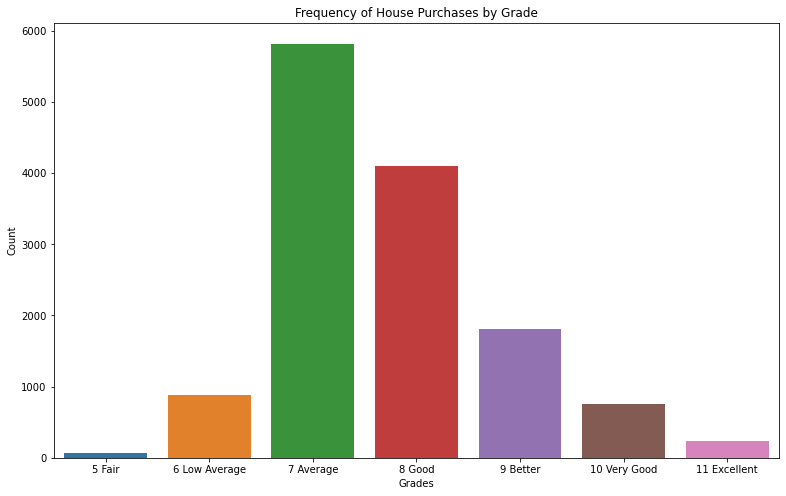

In [20]:
plt.figure(figsize=(13,8))

grade_group = df.groupby(by=["grade"])
grade_freq = grade_group.size()
grade_freq_plot = sns.barplot(grade_freq.index, grade_freq.values)
grade_freq_plot.set(xlabel="Grades", ylabel="Count", title="Frequency of House Purchases by Grade")
grade_freq_plot.set_xticklabels(['5 Fair', '6 Low Average', '7 Average', '8 Good', '9 Better', '10 Very Good', '11 Excellent'])
plt.show();

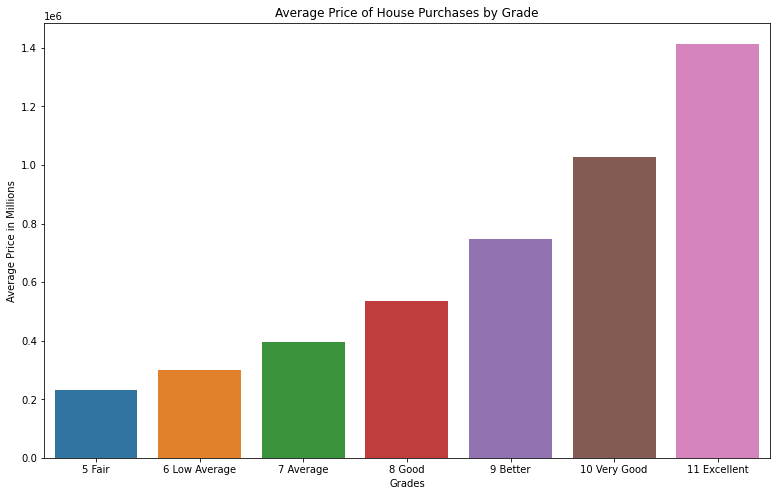

In [21]:
plt.figure(figsize=(13,8))

grade_price = grade_group["price"].mean()
grade_avg_price_plot = sns.barplot(x=grade_price.index, y=grade_price.values)
grade_avg_price_plot.set(xlabel="Grades", ylabel="Average Price in Millions", title="Average Price of House Purchases by Grade")
grade_avg_price_plot.set_xticklabels(['5 Fair', '6 Low Average', '7 Average', '8 Good', '9 Better', '10 Very Good', '11 Excellent'])
plt.show()

In [22]:
target_df = df[df['grade'] <= 9]
target_df

,id,date,price,bedrooms,bathrooms,sqft_living,floors,condition,grade,yr_built,yr_renovated,zipcode,lat,long,grade_value,age,condition_num
0,7129300520,2014-10-13,221900.0,3,1.00,1180,1.0,Average,7,1955,0.0,98178,47.5112,-122.257,7,60.0,2
1,6414100192,2014-12-09,538000.0,3,2.25,2570,2.0,Average,7,1951,1991.0,98125,47.7210,-122.319,7,24.0,2
3,2487200875,2014-12-09,604000.0,4,3.00,1960,1.0,Very Good,7,1965,0.0,98136,47.5208,-122.393,7,50.0,4
4,1954400510,2015-02-18,510000.0,3,2.00,1680,1.0,Average,8,1987,0.0,98074,47.6168,-122.045,8,28.0,2
6,1321400060,2014-06-27,257500.0,3,2.25,1715,2.0,Average,7,1995,0.0,98003,47.3097,-122.327,7,20.0,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
21590,7936000429,2015-03-26,1010000.0,4,3.50,3510,2.0,Average,9,2009,0.0,98136,47.5537,-122.398,9,6.0,2
21591,2997800021,2015-02-19,475000.0,3,2.50,1310,2.0,Average,8,2008,0.0,98116,47.5773,-122.409,8,7.0,2
21592,263000018,2014-05-21,360000.0,3,2.50,1530,3.0,Average,8,2009,0.0,98103,47.6993,-122.346,8,6.0,2
21593,6600060120,2015-02-23,400000.0,4,2.50,2310,2.0,Average,8,2014,0.0,98146,47.5107,-122.362,8,1.0,2


In [23]:
df['grade'].replace((5, 6, 7, 8, 9, 10, 11), ('5 Fair', '6 Low Average', '7 Average', '8 Good', '9 Better', '10 Very Good', '11 Excellent'), inplace=True)

In [24]:
target_df = target_df[target_df['price'] <= 730000]
target_df

,id,date,price,bedrooms,bathrooms,sqft_living,floors,condition,grade,yr_built,yr_renovated,zipcode,lat,long,grade_value,age,condition_num
0,7129300520,2014-10-13,221900.0,3,1.00,1180,1.0,Average,7,1955,0.0,98178,47.5112,-122.257,7,60.0,2
1,6414100192,2014-12-09,538000.0,3,2.25,2570,2.0,Average,7,1951,1991.0,98125,47.7210,-122.319,7,24.0,2
3,2487200875,2014-12-09,604000.0,4,3.00,1960,1.0,Very Good,7,1965,0.0,98136,47.5208,-122.393,7,50.0,4
4,1954400510,2015-02-18,510000.0,3,2.00,1680,1.0,Average,8,1987,0.0,98074,47.6168,-122.045,8,28.0,2
6,1321400060,2014-06-27,257500.0,3,2.25,1715,2.0,Average,7,1995,0.0,98003,47.3097,-122.327,7,20.0,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
21589,3448900210,2014-10-14,610685.0,4,2.50,2520,2.0,Average,9,2014,0.0,98056,47.5137,-122.167,9,1.0,2
21591,2997800021,2015-02-19,475000.0,3,2.50,1310,2.0,Average,8,2008,0.0,98116,47.5773,-122.409,8,7.0,2
21592,263000018,2014-05-21,360000.0,3,2.50,1530,3.0,Average,8,2009,0.0,98103,47.6993,-122.346,8,6.0,2
21593,6600060120,2015-02-23,400000.0,4,2.50,2310,2.0,Average,8,2014,0.0,98146,47.5107,-122.362,8,1.0,2


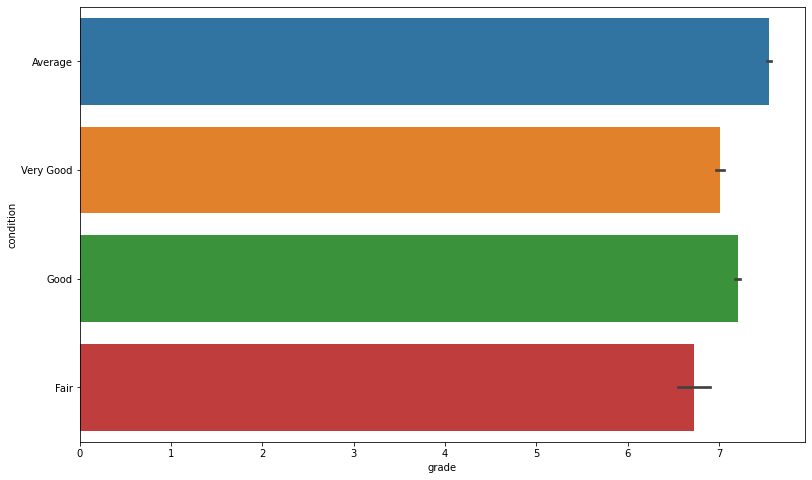

In [25]:
plt.figure(figsize=(13,8))

sns.barplot(x=target_df['grade'], y=target_df['condition'])
plt.show();

In [26]:
three_bed_homes = target_df[target_df['bedrooms'] == 3]
three_bed_homes

,id,date,price,bedrooms,bathrooms,sqft_living,floors,condition,grade,yr_built,yr_renovated,zipcode,lat,long,grade_value,age,condition_num
0,7129300520,2014-10-13,221900.0,3,1.00,1180,1.0,Average,7,1955,0.0,98178,47.5112,-122.257,7,60.0,2
1,6414100192,2014-12-09,538000.0,3,2.25,2570,2.0,Average,7,1951,1991.0,98125,47.7210,-122.319,7,24.0,2
4,1954400510,2015-02-18,510000.0,3,2.00,1680,1.0,Average,8,1987,0.0,98074,47.6168,-122.045,8,28.0,2
6,1321400060,2014-06-27,257500.0,3,2.25,1715,2.0,Average,7,1995,0.0,98003,47.3097,-122.327,7,20.0,2
7,2008000270,2015-01-15,291850.0,3,1.50,1060,1.0,Average,7,1963,0.0,98198,47.4095,-122.315,7,52.0,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
21587,7852140040,2014-08-25,507250.0,3,2.50,2270,2.0,Average,8,2003,0.0,98065,47.5389,-121.881,8,12.0,2
21588,9834201367,2015-01-26,429000.0,3,2.00,1490,3.0,Average,8,2014,0.0,98144,47.5699,-122.288,8,1.0,2
21591,2997800021,2015-02-19,475000.0,3,2.50,1310,2.0,Average,8,2008,0.0,98116,47.5773,-122.409,8,7.0,2
21592,263000018,2014-05-21,360000.0,3,2.50,1530,3.0,Average,8,2009,0.0,98103,47.6993,-122.346,8,6.0,2


In [27]:
four_bed_homes = target_df[target_df['bedrooms'] == 4]
four_bed_homes

,id,date,price,bedrooms,bathrooms,sqft_living,floors,condition,grade,yr_built,yr_renovated,zipcode,lat,long,grade_value,age,condition_num
3,2487200875,2014-12-09,604000.0,4,3.00,1960,1.0,Very Good,7,1965,0.0,98136,47.5208,-122.393,7,50.0,4
15,9297300055,2015-01-24,650000.0,4,3.00,2950,2.0,Average,9,1979,0.0,98126,47.5714,-122.375,9,36.0,2
17,6865200140,2014-05-29,485000.0,4,1.00,1600,1.5,Good,7,1916,0.0,98103,47.6648,-122.343,7,99.0,3
20,6300500875,2014-05-14,385000.0,4,1.75,1620,1.0,Good,7,1947,0.0,98133,47.7025,-122.341,7,68.0,3
29,1873100390,2015-03-02,719000.0,4,2.50,2570,2.0,Average,8,2005,0.0,98052,47.7073,-122.110,8,10.0,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
21561,3881900317,2015-01-23,579000.0,4,3.25,1900,2.0,Average,9,2014,0.0,98144,47.5869,-122.311,9,1.0,2
21578,5087900040,2014-10-17,350000.0,4,2.75,2500,2.0,Average,8,2008,0.0,98042,47.3749,-122.107,8,7.0,2
21582,8956200760,2014-10-13,541800.0,4,2.50,3118,2.0,Average,9,2014,0.0,98001,47.2931,-122.264,9,1.0,2
21589,3448900210,2014-10-14,610685.0,4,2.50,2520,2.0,Average,9,2014,0.0,98056,47.5137,-122.167,9,1.0,2


In [28]:
colormap = cm.LinearColormap(colors=['blue', 'green', 'yellow'], vmin=0, vmax=730000)
four_bed_homes_map = folium.Map(location=[47.560093, -122.213982], zoom_start=10)

# go through each home in set, make circle, and add to map.
for i in range(len(four_bed_homes)):
    folium.Circle(
        location=[four_bed_homes.iloc[i]['lat'], four_bed_homes.iloc[i]['long']],
        radius=10,
        fill_opacity=0.05,
        fill=True,
        color=colormap(four_bed_homes.iloc[i]['price']),
    ).add_to(four_bed_homes_map)
four_bed_homes_map.add_child(colormap)
# Same as before, we save it to file
four_bed_homes_map.save('circle_map.html')

In [29]:
four_bed_homes_map

In [30]:
colormap = cm.LinearColormap(colors=['blue', 'green', 'yellow'], vmin=0, vmax=730000)
three_bed_homes_map = folium.Map(location=[47.560093, -122.213982], zoom_start=10)

# go through each home in set, make circle, and add to map.
for i in range(len(three_bed_homes)):
    folium.Circle(
        location=[three_bed_homes.iloc[i]['lat'], three_bed_homes.iloc[i]['long']],
        radius=10,
        fill=True,
        color=colormap(three_bed_homes.iloc[i]['price']),
        fill_opacity=0.2
    ).add_to(three_bed_homes_map)
three_bed_homes_map.add_child(colormap)
# Same as before, we save it to file
three_bed_homes_map.save('circle_map.html')

In [31]:
three_bed_homes_map

In [ ]:
model = sm.formula.ols(formula=
'logged_price ~ bedrooms + bathrooms + condition +  + sqft_living + sqft_living15 + floors + grade + age', 
data=homes_for_poor)
result = model.fit()
model_summary = result.summary()
model_summary

In [ ]:
formula = 'logged_price ~ bedrooms + bathrooms + condition + lat + sqft_living + sqft_living15 + floors + grade + age'
lm = ols(formula, homes_for_poor).fit()
table = sm.stats.anova_lm(lm, typ=2)
print(table)

In [34]:
target_df['zipcode'] = target_df['zipcode'].astype('str')
# get the mean value across all data points
zipcode_data = target_df.groupby('zipcode').aggregate(np.mean)
zipcode_data.reset_index(inplace = True)

<ipython-input-34-10079166a637>:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  target_df['zipcode'] = target_df['zipcode'].astype('str')


In [35]:
zipcode_data

,zipcode,id,price,bedrooms,bathrooms,sqft_living,floors,grade,yr_built,yr_renovated,lat,long,grade_value,age,condition_num
0,98001,4.710079e+09,276884.231076,3.406375,2.039841,1875.601594,1.432271,7.298805,1983.035857,15.725100,47.309766,-122.270331,7.298805,31.621514,2.302789
1,98002,5.114443e+09,235928.429630,3.303704,1.816667,1596.785185,1.355556,6.748148,1971.659259,73.592593,47.309800,-122.212281,6.748148,41.644444,2.674074
2,98003,4.657799e+09,278856.726368,3.293532,1.992537,1820.094527,1.303483,7.432836,1977.592040,0.000000,47.315536,-122.309617,7.432836,37.407960,2.363184
3,98004,3.996331e+09,647538.000000,3.280000,1.670000,1676.000000,1.080000,7.280000,1957.040000,0.000000,47.606164,-122.195800,7.280000,57.960000,2.600000
4,98005,5.393528e+09,617051.000000,3.415094,2.089623,2000.754717,1.150943,7.792453,1967.150943,0.000000,47.600179,-122.168736,7.792453,47.849057,2.566038
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
64,98177,4.033470e+09,505854.458333,3.350000,1.937500,1985.916667,1.250000,7.591667,1961.275000,82.833333,47.744957,-122.367842,7.591667,52.225000,2.466667
65,98178,4.217603e+09,289914.021739,3.405797,1.742754,1722.681159,1.159420,6.811594,1955.057971,72.695652,47.499424,-122.248297,6.811594,57.413043,2.362319
66,98188,4.473994e+09,285715.734940,3.433735,1.840361,1832.409639,1.259036,7.096386,1966.602410,71.759036,47.446340,-122.280880,7.096386,47.012048,2.240964
67,98198,5.680411e+09,289189.795322,3.339181,1.796784,1720.584795,1.228070,7.081871,1967.263158,69.888889,47.391382,-122.315216,7.081871,45.666667,2.385965


In [36]:
# count number of houses grouped by zipcode
target_df['count'] = 1
temp = target_df.groupby('zipcode').sum()
temp.reset_index(inplace = True)
temp = temp[['zipcode', 'count']]
zipcode_data = pd.merge(zipcode_data, temp, on='zipcode')
# drop count from org dataset
target_df.drop(['count'], axis = 1, inplace = True)

<ipython-input-36-a53dcba55809>:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  target_df['count'] = 1
C:\Users\grego\anaconda3\envs\learn-env\lib\site-packages\pandas\core\frame.py:4163: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  return super().drop(


In [37]:
boundary_file = "data/Zipcodes_for_King_County_and_Surrounding_Area__Shorelines____zipcode_shore_area.geojson"
with open(boundary_file, 'r') as f:
    geo_data = json.load(f)
    
tmp = geo_data
# remove ZIP codes not in geo data
geozips = []
for i in range(len(tmp['features'])):
    if tmp['features'][i]['properties']['ZIPCODE'] in list(zipcode_data['zipcode'].unique()):
        geozips.append(tmp['features'][i])
# creating new JSON object
new_json = dict.fromkeys(['type','features'])
new_json['type'] = 'FeatureCollection'
new_json['features'] = geozips
# save uodated JSON object
open("cleaned_geodata.json", "w").write(json.dumps(new_json, sort_keys=True, indent=4, separators=(',', ': ')))

14807801

In [38]:
def map_feature_by_zipcode(zipcode_data, col):
    """
    Generates a folium map of Seattle
    :param zipcode_data: zipcode dataset
    :param col: feature to display
    :return: m
    """

    # read updated geo data
    king_geo = "cleaned_geodata.json"

    # Initialize Folium Map with Seattle latitude and longitude
    m = folium.Map(location=[47.35, -121.9], zoom_start=9.25,
                   detect_retina=True, control_scale=False, tiles='OpenStreetMap')

    # Create choropleth map
    m.choropleth(
        geo_data=king_geo,
        name='choropleth',
        data=zipcode_data,
        # col: feature of interest
        columns=['zipcode', col],
        key_on='feature.properties.ZIPCODE',
        fill_color='YlGnBu',
        fill_opacity=0.7,
        line_opacity=0.2,
        legend_name='house ' + col
    )
    folium.LayerControl().add_to(m)

    # Save map based on feature of interest
    m.save(col + '.html')

    return m

In [39]:
map_feature_by_zipcode(zipcode_data, 'price')

C:\Users\grego\anaconda3\envs\learn-env\lib\site-packages\folium\folium.py:411: FutureWarning: The choropleth  method has been deprecated. Instead use the new Choropleth class, which has the same arguments. See the example notebook 'GeoJSON_and_choropleth' for how to do this.
  warnings.warn(
